In [1]:
import os
import sys
import pytz
import argparse
# import jax.numpy as jnp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from geopy import distance
import datetime
import tilemapbase
from copy import deepcopy
import pickle as pkl
from PIL import Image
import skimage.measure
import math
import warnings
warnings.filterwarnings('ignore')
warnings.simplefilter('ignore')
os.environ['PYTHONWARNINGS']='ignore'
# import hyperopt
# from joblib import Parallel, delayed
# import random
# random.seed(42)
# import scipy
# import torch
# from pykrige.ok import OrdinaryKriging
# from pykrige.ok3d import OrdinaryKriging3D
# from pykrige.uk import UniversalKriging
# from sklearn.model_selection import train_test_split
# from scipy.interpolate import CubicSpline

In [2]:
df_proj = pd.read_csv("../field_estimation/heatmaps_longitudinal.csv", index_col=0,parse_dates=True)

In [3]:
df_proj

,0,1,2,3,4,5,6,7,8,9,...,1590,1591,1592,1593,1594,1595,1596,1597,1598,1599
timestamp_round,,,,,,,,,,,,,,,,,,,,,
2018-05-01 04:00:00+05:30,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,...,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875,46.282875
2018-05-01 05:00:00+05:30,45.556103,45.556103,45.556103,45.556103,45.556103,45.556103,45.556103,45.556103,45.556103,45.556103,...,45.556103,45.556104,45.556104,45.556104,45.556104,45.556104,45.556104,45.556104,45.556104,45.556104
2018-05-01 06:00:00+05:30,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,...,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919,46.177919
2018-05-01 07:00:00+05:30,46.184133,46.158475,46.128288,46.091000,46.044925,45.991626,45.935333,45.880414,45.830259,45.787257,...,47.769131,47.798485,47.823646,47.844612,47.861552,47.874759,47.884598,47.891470,47.895774,47.897892
2018-05-01 08:00:00+05:30,48.248577,48.248576,48.248575,48.248573,48.248572,48.248570,48.248568,48.248567,48.248565,48.248564,...,48.248656,48.248656,48.248656,48.248655,48.248655,48.248654,48.248654,48.248653,48.248653,48.248652
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-31 15:00:00+05:30,82.815380,82.904584,82.993067,83.079220,83.161173,83.236818,83.303862,83.359953,83.402860,83.430729,...,89.500629,89.750995,89.973228,90.167229,90.334058,90.475618,90.594338,90.692882,90.773935,90.840048
2020-10-31 16:00:00+05:30,76.277608,76.285797,76.294719,76.303566,76.311409,76.317223,76.319925,76.318446,76.311841,76.299425,...,92.315786,92.526739,92.707831,92.858645,92.980190,93.074533,93.144413,93.192886,93.223052,93.237869
2020-10-31 17:00:00+05:30,77.326426,77.234444,77.143319,77.053141,76.964054,76.876276,76.790132,76.706076,76.624707,76.546771,...,98.317392,98.376542,98.419340,98.444167,98.450762,98.439944,98.413277,98.372752,98.320528,98.258746


In [4]:
df_proj.columns = df_proj.columns+"a"

In [5]:
df_proj = df_proj.groupby(df_proj.index.date).mean()

In [6]:
df_proj

,0a,1a,2a,3a,4a,5a,6a,7a,8a,9a,...,1590a,1591a,1592a,1593a,1594a,1595a,1596a,1597a,1598a,1599a
2018-05-01,49.941105,49.773356,49.545385,49.226510,48.798864,48.283989,47.731415,47.187005,46.681729,46.234027,...,54.144516,53.904590,53.684518,53.483234,53.299385,53.131461,52.977904,52.837185,52.707862,52.588615
2018-05-02,55.054375,55.161422,55.262890,55.351826,55.421471,55.469313,55.496150,55.502052,55.485270,55.443225,...,53.390099,53.256892,53.139659,53.037113,52.947730,52.869911,52.802111,52.742909,52.691049,52.645449
2018-05-03,37.398750,37.410741,37.468311,37.594215,37.806125,38.097698,38.440280,38.800183,39.146825,39.453821,...,48.816852,48.564889,48.345783,48.156279,47.992631,47.850983,47.727650,47.619298,47.523039,47.436455
2018-05-04,50.479525,50.760196,51.077357,51.415747,51.753674,52.091582,52.440463,52.789645,53.106207,53.347322,...,44.476719,44.284827,44.154697,44.075252,44.036035,44.027619,44.041875,44.072064,44.112809,44.159957
2018-05-05,62.598183,62.283820,61.927717,61.503897,60.998053,60.435334,59.867344,59.338581,58.876496,58.495463,...,80.589266,80.408698,80.246784,80.103281,79.976255,79.862838,79.759885,79.664439,79.573988,79.486568
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2020-10-27,120.507144,122.078007,123.685336,125.315662,126.954417,128.586440,130.196548,131.770156,133.293998,134.756927,...,178.495504,178.463839,178.757657,179.295589,179.994996,180.782081,181.597604,182.398502,183.156606,183.855874
2020-10-28,132.816943,134.796498,136.797050,138.798898,140.781897,142.726565,144.615265,146.433312,148.169837,149.818247,...,221.480887,221.347038,221.750669,222.574352,223.694436,224.996683,226.385882,227.789461,229.156652,230.455133
2020-10-29,164.437803,166.605921,168.807064,171.016834,173.209521,175.359291,177.441484,179.433954,181.318444,183.081990,...,297.378737,300.686427,304.518601,308.679244,312.969128,317.210011,321.260570,325.022493,328.438429,331.484996
2020-10-30,163.431005,164.869227,166.337046,167.821245,169.308459,170.785930,172.242226,173.667866,175.055723,176.401182,...,243.053681,243.188887,243.694682,244.488270,245.481414,246.592008,247.751338,248.906969,250.022321,251.074359


In [7]:
df_proj.index = pd.to_datetime(df_proj.index)

In [8]:
df_2018 = df_proj[df_proj.index.year==2018]
df_2019 = df_proj[df_proj.index.year==2019]
df_2020 = df_proj[df_proj.index.year==2020]

In [9]:
def process_month(df_hsps, df_month, month, year):
    df_hsps.loc[str(month)+'-'+str(year)] = np.zeros(len(df_proj.columns))
    for sensor in df_month.columns:
        if(df_month[sensor].isna().sum()>10):
            continue
        if(len(df_month[sensor][df_month[sensor]>60])>0.6*len(df_month[sensor].dropna())):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1
        if(df_month[sensor].mean()>90):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1
        y = df_month[sensor].dropna()
        y = y-60
        y = (y>0).astype(int)
        y = y * (y.groupby((y != y.shift()).cumsum()).cumcount() + 1)
        if(max(y)>=3):
            df_hsps.loc[str(month)+'-'+str(year)][sensor] = 1   

In [10]:
df_hsps = pd.DataFrame(columns=df_proj.columns)
for month in range(5,13):
    df_month = df_2018[df_2018.index.month==month]    
    process_month(df_hsps, df_month, month, 2018)
    
for month in range(1,13):
    df_month = df_2019[df_2019.index.month==month]    
    process_month(df_hsps, df_month, month, 2019)
    
for month in range(1,10):
    df_month = df_2020[df_2020.index.month==month]    
    process_month(df_hsps, df_month, month, 2020)

In [11]:
df_num_hsps = df_hsps.sum(axis=0)

In [12]:
hotspots_map = df_num_hsps.to_numpy().reshape(40,40)

In [13]:
hotspots_map = hotspots_map[::-1,:] # because generated the interpolation in reversed latitude direction

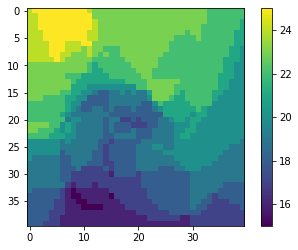

In [14]:
plt.imshow(hotspots_map)
plt.colorbar()

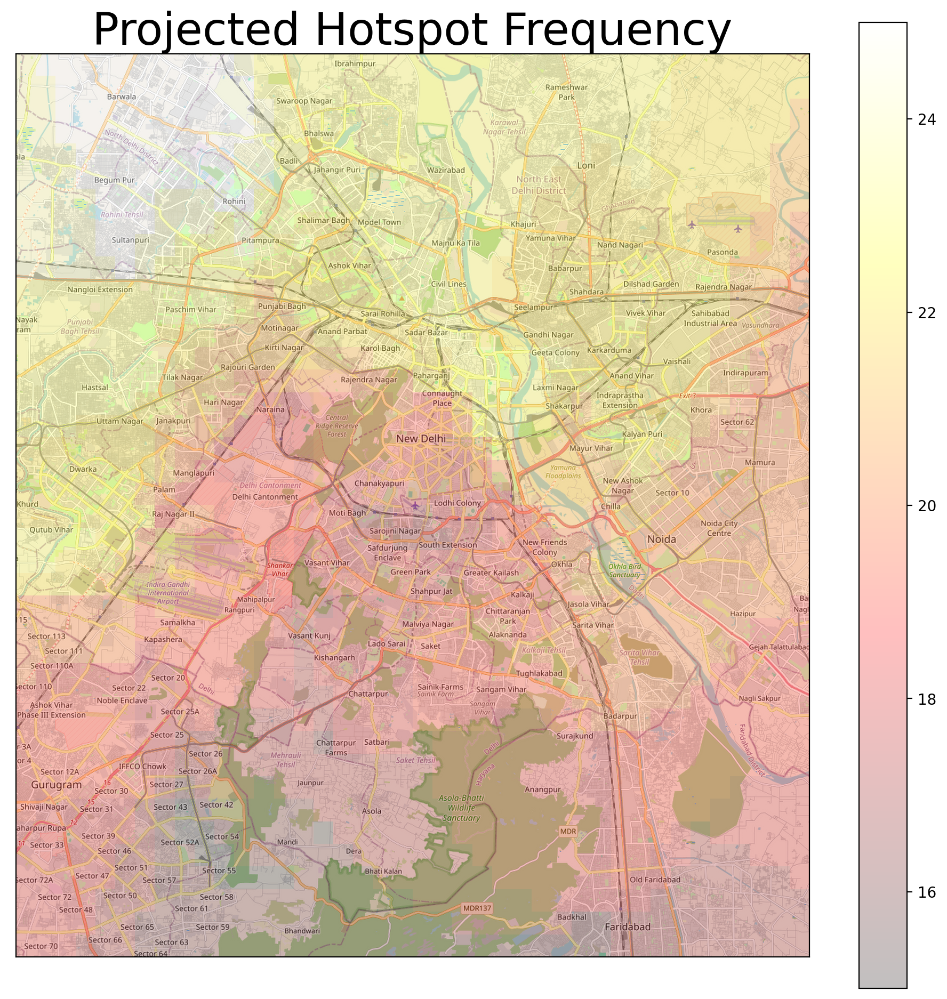

In [15]:
region_lat_b, region_lat_t, region_long_l, region_long_r = 28.39, 28.78, 77.01, 77.40
lat_lims = region_lat_b, region_lat_t
lon_lims = region_long_l, region_long_r
lat_center, lon_center = (region_lat_b + region_lat_t)/2, (region_long_l + region_long_r)/2

extent = tilemapbase.Extent.from_lonlat(region_long_l, region_long_r, region_lat_b, region_lat_t)
extent_proj = extent.to_project_3857

# use openstreetmap (OSM)
t = tilemapbase.tiles.build_OSM()

fig, ax = plt.subplots(figsize=(12,12), dpi=200)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plotter = tilemapbase.Plotter(extent, t, width=600)
plotter.plot(ax, t)
extent_mat = extent.xmin, extent.xmax, extent.ymax, extent.ymin
plt.imshow(hotspots_map, cmap='hot', alpha=0.25, extent=extent_mat)
plt.colorbar()
plt.title('Projected Hotspot Frequency', fontsize=30)
fig.savefig('hotspot_map.png',bbox_inches='tight')
plt.show()
plt.close(fig)

In [16]:
df_pop = pd.read_csv('../source_apportionment/pop_dens_cells.txt', sep=' ', header=None)
df_pop = df_pop.iloc[int(((90-28.78)/90)*10800):int(((90-28.39)/90)*10800), int((77.01/90)*10800):int((77.40/90)*10800)]
pop_matrix = df_pop.to_numpy()
mat = np.repeat(pop_matrix, 40, axis=0)
mat = np.repeat(mat, 40, axis=1)
pop_matrix = skimage.measure.block_reduce(mat, (47,47), np.mean)
pop_matrix = pop_matrix*(47/40)

In [17]:
np.sum(np.multiply(pop_matrix, hotspots_map))/(np.sum(pop_matrix)*29)

0.726754574512042

In [18]:
0.7268*np.sum(pop_matrix)

16682518.756173246

In [19]:
from scipy.stats import percentileofscore
hsp_arr = hotspots_map.flatten()
pop_arr = pop_matrix.flatten()
print(hsp_arr.shape, pop_arr.shape)
hsp_ser = pd.Series(hsp_arr)
pop_ser = pd.Series(pop_arr)

(1600,) (1600,)


In [20]:
hsp_per = hsp_ser.apply(lambda x: percentileofscore(hsp_arr, x))
hotspots_percentile = hsp_per.to_numpy().reshape(40,40)

In [21]:
pop_per = pop_ser.apply(lambda x: percentileofscore(pop_arr, x))
pop_percentile = pop_per.to_numpy().reshape(40,40)

In [22]:
exposure_map = (pop_percentile*hotspots_percentile)/100

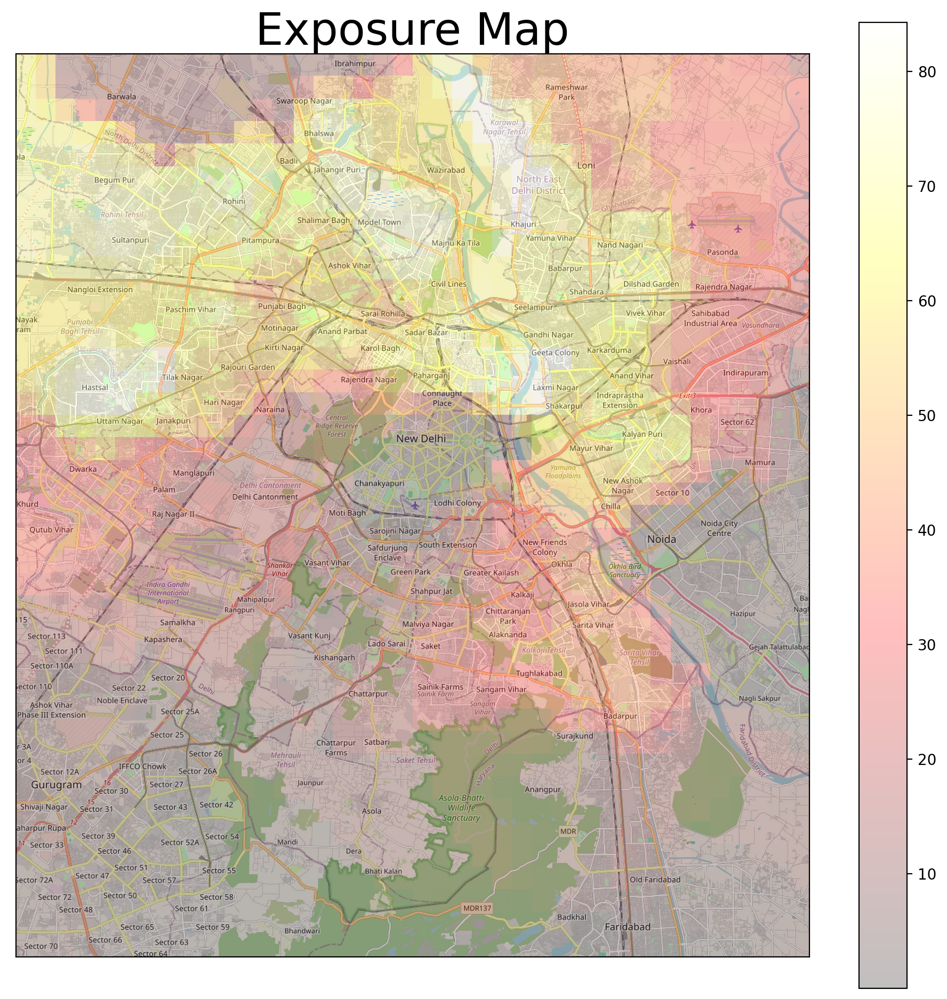

In [23]:
t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12), dpi=200)
ax.xaxis.set_visible(False)
ax.yaxis.set_visible(False)

plotter = tilemapbase.Plotter(extent, t, width=600)
plotter.plot(ax, t)
extent_mat = extent.xmin, extent.xmax, extent.ymax, extent.ymin
plt.imshow(exposure_map, cmap='hot', alpha=0.25, extent=extent_mat)
plt.colorbar()
plt.title('Exposure Map', fontsize=30)
fig.savefig('exposure_map.png',bbox_inches='tight')
plt.show()
plt.close(fig)

In [24]:
percent_time = hotspots_map/29

In [25]:
percent_pop = pop_matrix/np.sum(pop_matrix)

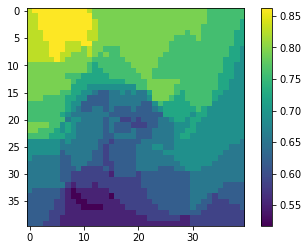

In [29]:
plt.imshow(percent_time)
plt.colorbar()

In [30]:
np.min(percent_time)

0.5172413793103449

In [31]:
np.sum(pop_matrix)

22953382.988680854